**Instituto de matemática e estatística - USP**

**Professores**: Roberto Marcondes Cesar Jr. - Roberto Hirata Jr.

**Aluno:** Daniel Silva Lopes da costa 

**N°USP:** 11302720

# EP2-MODELAGEM E SIMULAÇÃO





O COVID-19 é uma doença infeciosa causada pelo coronavírus da síndrome respiratória aguda grave 2. Os sintomas mais comuns são febre, tosse seca e cansaço. Por ainda não existir um tratamento específico a principal forma  de combate foi o distanciamento social o que atingiu quase a totalidade da população do globo de alguma forma. Diante dessa nova ordem mundial uma ferramenta de extrema importância são os modelos estatíscos que visam entender o comportamento do vírus para que assim os governos e a sociedade possam agir da melhor maneira possível no combate a doença e na manutenção do bem-estar social. O objetivo desse exercícios programa é implementar um desse modelos estatíscos de maneira simplificada, a fim de identificar possíveis curvas da doença e enetender como os modelos matemáticos podem ser ultilizados em situações reais, o modelo que será ultilizado encontra-se no artigo do pesquisador Giorgio SONNINO da Universidade Livre de Bruxelas. A equação diferencial que será ultilizada é:
$$\frac{dN}{dt}=\alpha(1-\frac{N}{\eta t^2})N-(\frac{2 \lambda t^2-1}{t}-\frac{\lambda t_0^2}{t}e^{-\lambda (t-t_0)^2})N$$

Como base nisso temos que:



*   $N$ é número total de casos, ou seja a soma de todos os novos casos diários, o menor valor que n pode assumir é zero que seria quando a pouplação estivesse completamente livre da doença.

*  $dN$ será representado no algoritmo pelo variável V, representada a velocidade de contágio, ou seja o número de novos casos diários, Tal indice pode assumir valores negativos se o número de pessoas curadas ultrapassar o número de novos casos.

*   $dt$ é a variação do tempo no qual são contados os novos casos, seguindo os exemplos reais e teóricos esse indice será atualizado um vez por dia, portanto dt=1 dia no algorimto.

*   $t_0$ é tempo incial para que medidas de retrição sejam impostas, como uso de máscaras, distanciamento social ou até mesmo lockdown.

*  $t$ será o tempo em dias desde o primeiro caso da doença foi resgistrado.

* $\alpha$ que será representado no algoritmo pela variável a, é fator de crescimento.

* $\lambda$ é o inverso do parâmetro $\sigma$ o qual depende do vírus e das condições de restrições, tal parâmetro será implementado no algoritmo como a variável h.

* $\eta$ é um parâmetro diretamente proporcial ao dobro do parâmetro $A$ que é subjetivo e depende de cada população e é inversamente proporcional ao $t_0$, será representado no algoritmo pela variável m.

Para implementar o algoritmo foi ultilizado o método de euler, onde o próximo número é gerado com base no caso anterior, no modelo acima foi usado a seguinte equação:

$$N_{n+1}=N_n+V \cdot \Delta t$$


A implementação dessa simulação foi dividida em dois casos, primeiramente será analisada uma ilha isolada com parâmetros indicados pelo programador, para que se posso analisar a formato da curva e o efeito inical de cada um dos parâmetros na implementação do modelo, em seguida será implamentado o mesmo modelo para cinco ilhas com parâmetros gerados de maneira pseudo-aleatória pelo computador, dentro de uma margem estabelecida, para que assim possa-se comparar diferentes formatos de curvas e possasse identificar de maneira ainda mais claro como cada um dos parâmetros afeta os índices, por fim será feita uma comparação entre esse modelo e o modelo epidemiológico SIR.



In [5]:
#Pimeiramente fazemos a importação dos pacotes necessários para implementação dos gráficos, animações e fórmulas matemáticas.
import math
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
from random import *


In [6]:
def variacao(t,to,a,h,m,n):
  return a*(1-n/(m*t*t))*n-((2*h*t*t-1)/t-((h*to*to)/t)*math.exp(-h*(t-to)**2))*n  #variação do número de casos

In [7]:
#Equação do método de Euler, eu que usamos o número anterior de casos para chegar ao novo valor.
def infectados(v,dt,n):
  return n+v*dt

### Simualção para uma ilha isolada

Para a modelagem de uma ilha isolada foram ultilizados parâmetros encontrados no artigo base, tais parâmetros fazem referência a curva de contágio da Itália e foram usados com o intuito de testar a corretude do cálculo do algoritmo com base no modelo de Euler. Para tanto adotou-se: $\alpha = 0.261 \hspace{0.1cm} dias^{-1}$;  $t_0=70.6 \hspace{0.1cm} dias$; $\lambda = 0.00185 \hspace{0.1cm} dias^{-2}$; $\eta=61.10 \hspace{0.1cm} dias^{-2}$ que foram o valores teóricos adotados para a Itália pelos pesquisadores, com tais parâmetros o algoritmo implementado nesse notebook conseguiu chegar a uma curva praticamente idêntica a curva teórica mostrada no artigo, o que comprova que o algorimto está sendo implementado corretamente. Além disso adotou-se como o primeiro dia, aquele com o primeiro caso registrado e foram datadas o número de casos diários e número de casos total em dois vetores, vale reassaltar também que adoutou-se o dia 73 como parada dos cálculo por ser o dia adotado no artigo.

In [19]:
            #Os parametros dt, to, a, h, m foram retirados do artigo do Sonnimo, e são os argumentos referentes a modelagem no caso da Itália.
dt=1        #Variação em dias.
to=70.6     #Tempo inicial das medidas de conteção.
a=0.261     #Fator de crecimento.
h=0.00185   
m=61.10     #m=2A/to, onde A é uma parâmetro que depende do vírus e das medidas de restição. 
n=1         #primeiro infectado
t=1         #dia um de contaminação
v=0
V=[]        #velocidade de difusão do vírus (Novos casos diários)
N=[]        #número de infectados por dia
tempo=[]

while(t<73): #Até o ponto onde vai o gráfico na representação 
    V.append(variacao(t,to,a,h,m,n))
    v=variacao(t,to,a,h,m,n)
    N.append(infectados(v,dt,n))
    n=infectados(v,dt,n)
    tempo.append(t)
    t+=dt


**Análise gráfica:**

Pelo gráfico sobre o número total de casos é possível perceber a autenticidade da simulação uma vez que no artigo base para esse exercício existe esse gráfico sobre a quantidade de casos total e é perceptível que os dois gráficos apresentam valores muito próximos o que demonstra a veracidade da simulação implementada. Além disso vale pontuar que o número de novos caso diário se aproxima muito dos valores reais uma vez que no pico da epidemia na Itália tivemos um pouco mais de 6000 novos caso por dia. 

É possível identificar ainda que o número de novos casos dários começou a cair a partir do 70° tal informação é de suma importância pos permite detectar o pico de contágio e mostra que as ferremantas de combate a doenças estão surtindo efeito. Sobre as curvas é pssível perceber ser carâcter dinâmico, com a subida exponencial do números de casos no primeiro gráficos diretamente relacionada ao aumento do número que casos diários.

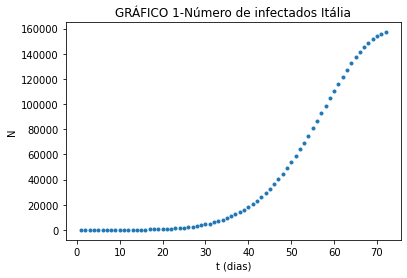

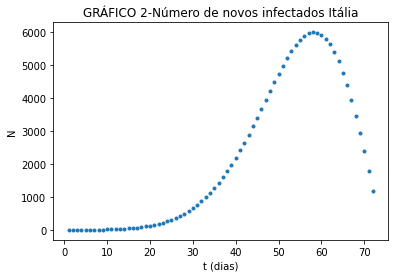

In [20]:
plt.figure(0)
plt.plot(tempo,N,linestyle='',marker='.')
plt.xlabel("t (dias)")
plt.ylabel("N")
plt.title('GRÁFICO 1-Número de infectados Itália')
plt.show(block=False)


plt.figure(0)
plt.plot(tempo,V,linestyle='',marker='.')
plt.xlabel("t (dias)")
plt.ylabel("N")
plt.title('GRÁFICO 2-Número de novos infectados Itália')
plt.show(block=False)


**Simulação dinâmica**

Por meio da simulação dinâmica do número total de casos pelo tempo é possível perceber a velocidade exponencial e chocante que o número de casos aumenta, atingindo patamares extremos em pouquíssimo tempo, contaminando mais de 150 mil pesssoas em menos de três meses. 

In [21]:
fig, ax = plt.subplots()
plt.title("ANIMAÇÃO 1: Número de casos total por dia")
plt.xlabel("t (dias)")
plt.ylabel("N")
plt.close()

ax.set_xlim((0, tempo[-1]))
ax.set_ylim((0, 180000))

line, = ax.plot([], [], lw=2)

def init():
    line.set_data([], [])
    return (line,)

def animate(i):
    line.set_data(tempo[:i], N[:i])
    return (line,)
  

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=100, interval=100, blit=True)

# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim

### Simulação para cinco ilhas

Na segunda parte dessa pesquisa foi a implementação da simulação para cinco ilhas distintas, onde os parâmetros foram gerados de maneira pseudo-aleatória pelo computador. Nesse sentido temos que  $0<\alpha < 1 \hspace{0.1cm} dias^{-1}$ o qual foi gerado pela função radom() que seleciona um valor float entre 0 e 1;  $10<t_0<100 \hspace{0.1cm} dias$ tal domínio foi estabelecido após sucetíveis testes e análise de valores teóricos já ultilizados, foi ultilizado a função radint(x,y) que devolve um inteiro entre x e y; $0.00185< \lambda < 0.00285 \hspace{0.1cm} dias^{-2}$ tal parametro possui um limitado domínio pois ele pode proj=vocar anomalias nas cruvas e dentro dessa linha de valores temos curvas bem comportadas e que atendem as necessidades para análise, tais números são gerados pela função uniform(w,z) que devolve valores do tipo float entre w e z; $50<\eta<70 \hspace{0.1cm} dias^{-2}$ para esse parâmetro foi ultilizado novamente a função radint, e o domínio doi estabelecido com base em testes e análise dis valores ultilizados no artigo base, vale pontuar que essa estratégia de gerar curvas como base me parâmetros aleatórios é base de métodos de suma importância como o Método de Monte Carlos que permite chegar aos parâmetros reias de uma determinada população.

Por serem cinco ilhas forma ultilizados vetores de estados, onde o vetor N, possui cinco lista onde cada uma se refere ao número total de cada uma das ilhas e de maneira análoga o vetor V, que comtempla os números de novos casos de cada uma das cinco situações. O tempo máximo de análise pe de 300 dias, tal valor foi escolhido com base em sucetíveis teste, que comprovaram que a maioria da curvas realizavam todo o seu ciclo em um tempo inferior a trezentos dias, além disso dependendo das natureza de cada o curva se todas as ilhas terminarem todo o ciclo de contaminação antes de trezentos, o algoritmo tem um mecanismo que para o tempo antes de se completar os 300 dias o que permite um melhor enquadramento de gráficos e animações. Além disso foram dois valores importantes estão sendo registrados nessa simulção, o indice da ilha que atingir o maior valor de infectados e também esse valor máximo de indectados, tais infromações serão importantes para implementação da simulação dinâmica. 

In [ ]:
#Temos um algotimos semelhante ao anterior, a nomeclatura das variáveis dorma preservados a fim de simplificar o entendimento e facilitar o processo.
dt=1
to=[randint(10,100),randint(10,100),randint(10,100),randint(10,100),randint(10,100)]
a=[random(),random(),random(),random(),random(),random()]
h=[uniform(0.00185,0.00285),uniform(0.00185,0.00285),uniform(0.00185,0.00285),uniform(0.00185,0.00285),uniform(0.00185,0.00285)]
m=[randint(50,70),randint(50,70),randint(50,70),randint(50,70),randint(50,70)]
n=[1,1,1,1,2]
t=1
v=[0,0,0,0,0]
tempo=[]
N=[[],[],[],[],[]]
V=[[],[],[],[],[]]

#Variáveis que guaradam informações importante para implementações visuais, o valor máximo de casos atingido pela 
NMAX=0
IMAX=0
TMAX=0
while(t<300 and TMAX==0):
    for i in range(5):
      V[i].append(variacao(t,to[i],a[i],h[i],m[i],n[i]))
      v[i]=variacao(t,to[i],a[i],h[i],m[i],n[i])
      N[i].append(infectados(v[i],dt,n[i]))
      n[i]=infectados(v[i],dt,n[i])
      if(N[i][-1]>NMAX):
        NMAX=N[i][-1]
        IMAX=i
    tempo.append(t)
    t+=dt
    if(t>50 and N[0][-1]<5 and N[1][-1]<5 and N[2][-1]<5 and N[3][-1]<5 and N[4][-1]):
      TMAX=t



Aqui podemos ver cada um dos parâmetros ultilizados em cada ilha e como eles impactam diretamente no número máximo de caso e no número diário de novos casos. Podemos rodar várias vezes o algorimto e assim ter uma noção verdadeira de como cada um dos parâmetros influência na curva de contágio, como base na comparação entre inúmeros casos.

In [ ]:
for i in range(5):
  print('Ilha', i+1,': Tempo inicial(to)=' , to[i], ';Fator de crescimento(a)=', a[i], '; (h)=',h[i],'; (m)=',m[i], '; Máx. número de casos=',int(max(N[i])))


Ilha 1 : Tempo inicial(to)= 15 ;Fator de crescimento(a)= 0.6286705095388941 ; (h)= 0.0025850397927613374 ; (m)= 56 ; Máx. número de casos= 129147
Ilha 2 : Tempo inicial(to)= 22 ;Fator de crescimento(a)= 0.5023722209815882 ; (h)= 0.002304840398209649 ; (m)= 67 ; Máx. número de casos= 126254
Ilha 3 : Tempo inicial(to)= 62 ;Fator de crescimento(a)= 0.1728635826519629 ; (h)= 0.0027917042380939533 ; (m)= 66 ; Máx. número de casos= 1240
Ilha 4 : Tempo inicial(to)= 93 ;Fator de crescimento(a)= 0.6816735650097913 ; (h)= 0.0022412076495445525 ; (m)= 62 ; Máx. número de casos= 384175
Ilha 5 : Tempo inicial(to)= 32 ;Fator de crescimento(a)= 0.9225993775503716 ; (h)= 0.0019287399620518631 ; (m)= 55 ; Máx. número de casos= 475259


**Análise Gráfica**

Temos aqui as curvas das cinco ilhas comparadas, é possível perceber a variedade de formatos dependendo dos parâmetros, temos ilhas em que mais 500 mil pessoas sâo infectados enquanto em outra menos de mil pessoas, o que realmente deixa claro a importância do meio e das medidas de prevenção na conteção da doença e como esse tipo de medida influência para que a doênça cresça de maneira mais exponecial ou não. Por ser um modelo com base em parâmtros aleatórios podemos realizar milhares de simulações diferentes e comparar e analisar diferentes gráficos a cada implementação.

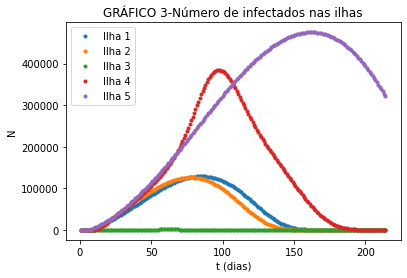

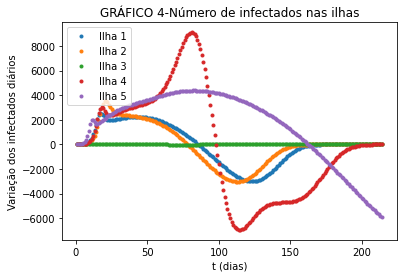

In [ ]:
plt.figure(0)
plt.plot(tempo,N[0],label='Ilha 1',linestyle='',marker='.')
plt.plot(tempo,N[1],label='Ilha 2',linestyle='',marker='.')
plt.plot(tempo,N[2],label='Ilha 3',linestyle='',marker='.')
plt.plot(tempo,N[3],label='Ilha 4',linestyle='',marker='.')
plt.plot(tempo,N[4],label='Ilha 5',linestyle='',marker='.')
plt.xlabel("t (dias)")
plt.ylabel("N")
plt.legend(loc="upper left")
plt.title('GRÁFICO 3-Número de infectados nas ilhas')
plt.show(block=False)



plt.figure(0)
plt.plot(tempo,V[0],label='Ilha 1',linestyle='',marker='.')
plt.plot(tempo,V[1],label='Ilha 2',linestyle='',marker='.')
plt.plot(tempo,V[2],label='Ilha 3',linestyle='',marker='.')
plt.plot(tempo,V[3],label='Ilha 4',linestyle='',marker='.')
plt.plot(tempo,V[4],label='Ilha 5',linestyle='',marker='.')
plt.xlabel("t (dias)")
plt.ylabel("Variação dos infectados diários")
plt.legend(loc="upper left")
plt.title('GRÁFICO 4-Número de infectados nas ilhas')
plt.show(block=False)




A seguir temos a comparação entre os números totais de casos da ilhas comparadas uma a uma, o que resultou em alguns gráficos semelhantes as asas de borboletas das euqações de Lorenz. Como os fatores podem ser bem distintos alguns gráficos apresentaram uma aspecto muito deformado, justamente pela distinção entre os fatores que pode provocar a contaminação de menos de 5 mil pessoas ou a contaminação de mais de 400 mil. Por meio da análise desses gráficos é possível perceber como diferentes localidades podem apresentar distições mesmo estando no mesmo período da doença, tudo depende das caracteríticas de cada população de da forma como as medidas de combate são implementadas. 

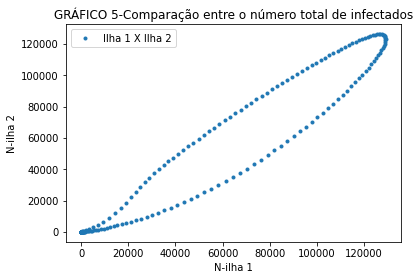

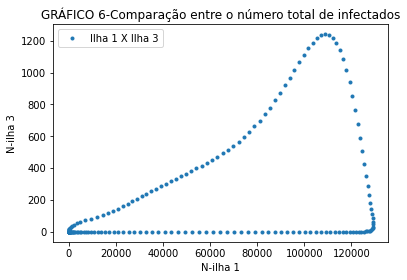

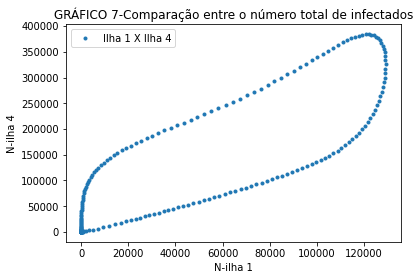

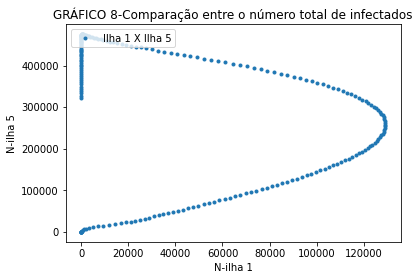

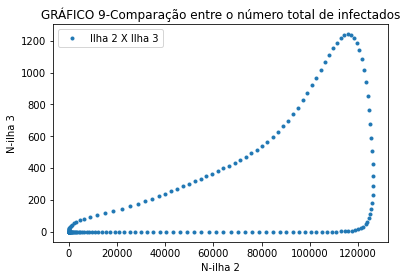

...

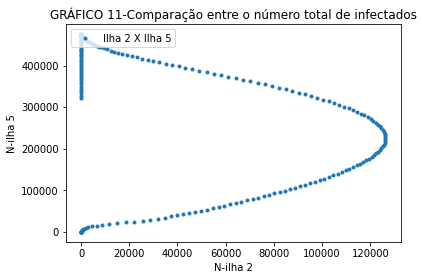

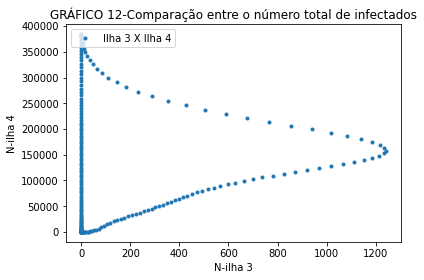

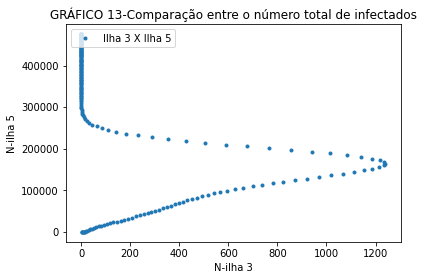

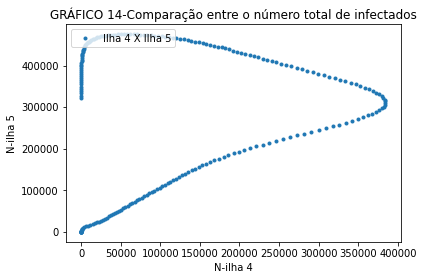

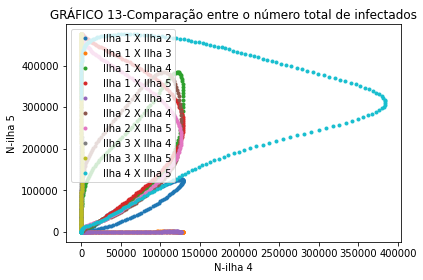

In [ ]:

plt.figure(0)
plt.plot(N[0],N[1],label='Ilha 1 X Ilha 2',linestyle='',marker='.')
plt.xlabel("N-ilha 1")
plt.ylabel("N-ilha 2")
plt.legend(loc="upper left")
plt.title('GRÁFICO 5-Comparação entre o número total de infectados')
plt.show(block=False)

plt.figure(0)
plt.plot(N[0],N[2],label='Ilha 1 X Ilha 3',linestyle='',marker='.')
plt.xlabel("N-ilha 1")
plt.ylabel("N-ilha 3")
plt.legend(loc="upper left")
plt.title('GRÁFICO 6-Comparação entre o número total de infectados')
plt.show(block=False)

plt.figure(0)
plt.plot(N[0],N[3],label='Ilha 1 X Ilha 4',linestyle='',marker='.')
plt.xlabel("N-ilha 1")
plt.ylabel("N-ilha 4")
plt.legend(loc="upper left")
plt.title('GRÁFICO 7-Comparação entre o número total de infectados')
plt.show(block=False)

plt.figure(0)
plt.plot(N[0],N[4],label='Ilha 1 X Ilha 5',linestyle='',marker='.')
plt.xlabel("N-ilha 1")
plt.ylabel("N-ilha 5")
plt.legend(loc="upper left")
plt.title('GRÁFICO 8-Comparação entre o número total de infectados')
plt.show(block=False)

plt.figure(0)
plt.plot(N[1],N[2],label='Ilha 2 X Ilha 3',linestyle='',marker='.')
plt.xlabel("N-ilha 2")
plt.ylabel("N-ilha 3")
plt.legend(loc="upper left")
plt.title('GRÁFICO 9-Comparação entre o número total de infectados')
plt.show(block=False)

plt.figure(0)
plt.plot(N[1],N[3],label='Ilha 2 X Ilha 4',linestyle='',marker='.')
plt.xlabel("N-ilha 2")
plt.ylabel("N-ilha 4")
plt.legend(loc="upper left")
plt.title('GRÁFICO 10-Comparação entre o número total de infectados')
plt.show(block=False)

plt.figure(0)
plt.plot(N[1],N[4],label='Ilha 2 X Ilha 5',linestyle='',marker='.')
plt.xlabel("N-ilha 2")
plt.ylabel("N-ilha 5")
plt.legend(loc="upper left")
plt.title('GRÁFICO 11-Comparação entre o número total de infectados')
plt.show(block=False)

plt.figure(0)
plt.plot(N[2],N[3],label='Ilha 3 X Ilha 4',linestyle='',marker='.')
plt.xlabel("N-ilha 3")
plt.ylabel("N-ilha 4")
plt.legend(loc="upper left")
plt.title('GRÁFICO 12-Comparação entre o número total de infectados')
plt.show(block=False)

plt.figure(0)
plt.plot(N[2],N[4],label='Ilha 3 X Ilha 5',linestyle='',marker='.')
plt.xlabel("N-ilha 3")
plt.ylabel("N-ilha 5")
plt.legend(loc="upper left")
plt.title('GRÁFICO 13-Comparação entre o número total de infectados')
plt.show(block=False)

plt.figure(0)
plt.plot(N[3],N[4],label='Ilha 4 X Ilha 5',linestyle='',marker='.')
plt.xlabel("N-ilha 4")
plt.ylabel("N-ilha 5")
plt.legend(loc="upper left")
plt.title('GRÁFICO 14-Comparação entre o número total de infectados')
plt.show(block=False)

plt.figure(0)
plt.plot(N[0],N[1],label='Ilha 1 X Ilha 2',linestyle='',marker='.')
plt.plot(N[0],N[2],label='Ilha 1 X Ilha 3',linestyle='',marker='.')
plt.plot(N[0],N[3],label='Ilha 1 X Ilha 4',linestyle='',marker='.')
plt.plot(N[0],N[4],label='Ilha 1 X Ilha 5',linestyle='',marker='.')
plt.plot(N[1],N[2],label='Ilha 2 X Ilha 3',linestyle='',marker='.')
plt.plot(N[1],N[3],label='Ilha 2 X Ilha 4',linestyle='',marker='.')
plt.plot(N[1],N[4],label='Ilha 2 X Ilha 5',linestyle='',marker='.')
plt.plot(N[2],N[3],label='Ilha 3 X Ilha 4',linestyle='',marker='.')
plt.plot(N[2],N[4],label='Ilha 3 X Ilha 5',linestyle='',marker='.')
plt.plot(N[3],N[4],label='Ilha 4 X Ilha 5',linestyle='',marker='.')
plt.xlabel("N-ilha 4")
plt.ylabel("N-ilha 5")
plt.legend(loc="upper left")
plt.title('GRÁFICO 13-Comparação entre o número total de infectados')
plt.show(block=False)

**Animação dinâmica**

Por meio da animação dinâmica é possível ver de maneira análoga ao caso 1, a curva com o número total de pessoas infectadas, o que permite ver de maneira claro o avanço da doença em função do tempo assim como o decrescimento desta. Por serem cinco ilhas e os parâmetro podem ser alterados com frequência o algoritmo sempre vai fazer a animação dinâmica da ilha com maior número de casos a fim de se ter o melhor enquadramento com tempo, além disso vale destacar que como é possível girar o algoritmo inúmeras vezes podemos ter milhares de simulações para parâmetros e casos distintos. 

In [ ]:
fig, ax = plt.subplots()
plt.title("ANIMAÇÃO 2: Número de casos total por dia")
plt.close()

ax.set_xlim((0, tempo[-1]))
ax.set_ylim((0, max(N[IMAX])+int(0.1*max(N[IMAX]))))

line, = ax.plot([], [], lw=2)

def init():
    line.set_data([], [])
    return (line,)

def animate(i):
    line.set_data(tempo[:i], N[IMAX][:i])


    return (line,)
  

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=tempo[-1], interval=100, blit=True)

# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim

### Simulação extra
O objetivo dessa última parte pe implementar outro modelo e compará-lo com o implementado acima. O modelo escolhido foi o modelo SIR. O modelo epidemiológico SIR foi desenvolvido em 1927, é atualmente um dos modelos mais utilizados para representação de doenças infecciosas. O modelo divide a população em três compartimentos ou classes, cada compartimento indica o estado atual da doença nos indivíduos da população:

* $S$=Suscetíveis: pessoas que podem se contaminar;
* $I$=Infectados: pessoas que estão contaminadas;
* $R$=Recuperdaos: pessoas que já se recuperaram, estão imunes e não trasmitem mais o vírus (No caso do novo coronavírus ainda não se sabem se as pessoas recuperadas estão realmente imunes, mas existem evidências que comprovam nesse sentido e iremos adotar essa premissa como verdadeira, do contrário haveriam apenas dois grupos os suscetíveis e os infectados;
* $N$=Número de indivíduos de determinada população.


Uma diferenças clara entre esse modelo e o elaborado por Sonnino, é que esse modelo leva em consideração a quantidade total de indivíduos, no modelo usado acima a número de indvíduos da população deve estar obviamente ligada aos parametros $\sigma $ e $A$ que forma ultilizados, mas nesse modelo o tamanho da população é um valor conhecido e importante para a implementação.

Temos as seguinte equações básicas:

$\frac{dS}{dt}=-\frac{\beta I S}{N}$

$\frac{dI}{dt}=\frac{\beta I S}{N}-\gamma I$

$\frac{dR}{dt}=\gamma I$

Além disso temos também que:

$\frac{dS}{dt}+\frac{dI}{dt}+\frac{dR}{dt}=0$

$S(t)+I(t)+R(t)=N$

Outro conceito muito importate e que se relaciona diretamente com os parâmetros apresentados é a razão de reprodutividade basal $R_0$, o quel representa o número médio de infecções secundárias quando um indivíduo infectado é introduzido em uma população de hospedeiros completamente suscetíveis.
Nessa modelo temos que:
$R_0=\frac{\beta}{\gamma}$

* $\gamma$ é uma parâmentro inversamente proporcional ao tempo que a pessoas fica infectada pelo vírus, no caso do covid-20 não se sabe ao certo quantos dias elas permacem com o vírus, consideraremos portanto que o tempo de infeção é de 20 dias e portanto $\frac{1}{20 \cdot 10}=\gamma$=0,005 e será representado no algoritmo pela varável y.
* $\beta$ é um parâmentro que depende de $\gamma$ e de $R_0$ portanto, se considerarmos o $R_0=3$(índice real de várias cidades brasileiras)  temos que $\beta=3 \cdot 0,005= 0,015$


Com essa informações em mãos já podemos implementar nosso modelo, vamos considerar uma cidade com 100 habitantes e analisar a curva de crescimento do número de infectados durante um ano.

In [8]:
def euler(x,v,dt):
  return x+v*dt

In [9]:
def equacao2(y,i):
  return y*i

In [10]:
def equacao1(B,i,s,N):
  return (B*i*s)/N

In [15]:
B=0.015
y=0.005
N=100
s=N-1
i=1
r=0
dt=1
t=1
S=[]
I=[]
R=[]
vs=0
vi=0
vr=0
VS=[]
VI=[]
VR=[]
tempo=[]
while t<365:
  VS.append(-equacao1(B,i,s,N))
  vs=-equacao1(B,i,s,t)
  VI.append(equacao1(B,i,s,t)-equacao2(y,i))
  vi=equacao1(B,i,s,t)-equacao2(y,i)
  VR.append(equacao2(y,i))
  vr=equacao2(y,i)

  S.append(euler(s,vs,dt))
  s=euler(s,vs,dt)
  I.append(euler(i,vi,dt))
  i=euler(i,vi,dt)
  R.append(euler(r,vr,dt))
  r=euler(r,vr,dt)

  t+=dt
  tempo.append(t)






**Análise gráfica**

Um dos principais problemas desse modelo é que ele não cosidera as medidas de distânciamento social, apesar de ser possível implementar mais parametros afim de aproxima-lo da realidade para fins de descrição teórica esse modelo é mais do que suficiente para que possa-se ter uma noção melhor de como os modelos estatísticos modelam as informações sobre algum tipo de epidemia. Podemos ver pelo gráfico a correlação direta entre os números de pessoas sucetíveis, contaminadas e curadas, e perceber como a curva de infecção é parecida com o do modelo anterior, tendo uma subida exponencial. Além disso é importante notar como uma população reagiaria sem as medidas de distancimento social e combate a doença, nessa população com 100 pesssoas mais 80% foi infectado pela doença no período de um ano.

Pelo gráfico sobre os número de novos caso diários é possível perceber a explosão no número de novos casos logo nos primeiros dias, e logo em seguida com o aumento de pessoas curadas e imunes a propagação do vírus tende a cair. Com o tempo a grande massa de pessoas imunes formam uma barreira natural o que dificulta a propagação do vírus.

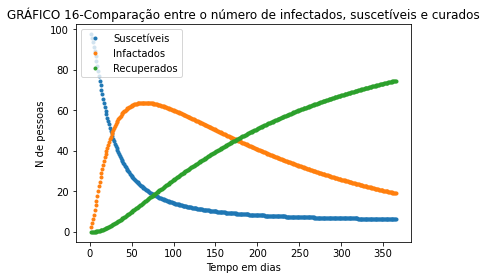

No handles with labels found to put in legend.


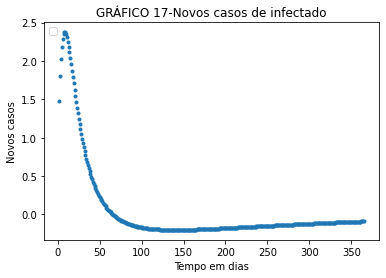

In [16]:
plt.figure(0)
plt.plot(tempo,S,label='Suscetíveis',linestyle='',marker='.')
plt.plot(tempo,I,label='Infactados',linestyle='',marker='.')
plt.plot(tempo,R,label='Recuperados',linestyle='',marker='.')
plt.xlabel("Tempo em dias")
plt.ylabel("N de pessoas")
plt.legend(loc="upper left")
plt.title('GRÁFICO 16-Comparação entre o número de infectados, suscetíveis e curados')
plt.show(block=False)


plt.figure(0)
plt.plot(tempo,VI,linestyle='',marker='.')
plt.xlabel("Tempo em dias")
plt.ylabel("Novos casos")
plt.legend(loc="upper left")
plt.title('GRÁFICO 17-Novos casos de infectado')
plt.show(block=False)


**Simulação dinâmica**

Assim como nos modelos anteriores podemos implementar um animação simples a fim de entender melhor o comportamento da curva de infectados. Por meio dela é possível perceber a explosão incial no número de casos, assim como a queda gradativa em função do tempo e assim enteder mehlro a dinâmica de um determinada epidemia.

In [17]:
fig, ax = plt.subplots()
plt.title("ANIMAÇÃO 3: Número de casos total por dia")
plt.close()

ax.set_xlim((0, tempo[-1]))
ax.set_ylim((0, max(I)+int(0.1*max(I))))

line, = ax.plot([], [], lw=2)

def init():
    line.set_data([], [])
    return (line,)

def animate(i):
    line.set_data(tempo[:i], I[:i])


    return (line,)
  

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=tempo[-1], interval=100, blit=True)

# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim

### Conclusões

Diante de tudo o que se foi apresentado, é cabível pontuar sobre a importância do algoritmo de Euler que funcinou de maneira satisfatória tanto no modelo inicial quanto na modelagem extra, o qual possiblitou simular o modelo dinâmico do COVID-19 resolvendo numericamente. Além disso vale destacar as inúmeras ferramentas de cálculo e exposição de imagens e informações que a ferramenta ultilizada Jupiter Notebook nos permitiu, como a comparação entre diferentes curvas e recursos lúdicos como as animações que enrequeceram o debate e o entendimento sobre o assunto. Outro ponto importante é sobre a definição dos parâmetros ultilizados nessa modelagem, que foram em sua maioria estimados de maneiras superficial, na força bruta e sem muito embasamento em casos reais, mas isso poderia ter sido feito com modelos de estatísticos estudados em aula, como o Método de Monte Carlos que estima parâmetros de uma dinâmica. Depende de amostragem aleatória repetida para encontrar resultados numéricos, ou seja basicamente o que foi realizado com as cinco ilhas neste relatório mas de maneira mais sofisticada e com o uso ainda mais ferramentas matemáticas. Por fim gostaria de ressaltar a importância desse tipo de simulação, principalemente em meio a uma pandemia, onde a informação é uma das maiores armas de combate a propagação do vírus.

**Referências**

[Quintas, 2019] Quintas, Thiago. (2019). *Métodos para estimação de parâmetros em um modelo SIR.* https://www.ime.usp.br/~map/tcc/2019/ThiagoQuintasV1.pdf

[Sonnino, 2020] Sonnino, Giorgio. (2020). *Dynamics of the COVID - Comparision between the Theoritical Predictions and the real Data.* https://arxiv.org/pdf/2003.13540v4.pdf.